# Project 1 - Exploratory Data Analysis for Machine Learning

this notebook contains a python code for my project-1 in EDA for IBM course

dataset source: [Mobile Price Classification by Abhishek Sharma](https://www.kaggle.com/iabhishekofficial/mobile-price-classification/version/1?select=train.csv) 


I'll work in this notebook on:

    1-Data Overview

    2-Data Cleaning and Feature Engineering
    
    3-Hypothesis Testing

## 1-Data Overview 

In [44]:
import os
import numpy as np
import pandas as pd
from sklearn import preprocessing
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats 
import math
sns.set()

%pylab inline
%config InlineBackend.figure_formats = ['retina']

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
# load dataset 
DataSet = pd.read_csv(r'C:\Users\admin\Desktop\studying\ML with py\project\train.csv')

In [3]:
#first look
DataSet.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,1,1,0,1


In [4]:
DataSet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  three_g        2000 non-null   int64  
 17  touch_screen   2000 non-null   int64  
 18  wifi    

In [5]:
DataSet.isnull().sum().sort_values()

battery_power    0
touch_screen     0
three_g          0
sc_w             0
sc_h             0
ram              0
px_width         0
px_height        0
pc               0
n_cores          0
mobile_wt        0
m_dep            0
int_memory       0
four_g           0
fc               0
dual_sim         0
clock_speed      0
blue             0
wifi             0
price_range      0
dtype: int64

## 2-Data Cleaning and Feature Engineering

In [6]:
#make a copy of our dataset
df = DataSet.copy()
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,1,1,0,1


In [107]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,ram,three_g,touch_screen,wifi,price_range,sc_size,px_per_in
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,9.916500,2124.213000,0.761500,0.503000,0.507000,1.500000,5.500850,151.594700
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,6.064315,1084.732044,0.426273,0.500116,0.500076,1.118314,2.014285,125.462112
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,256.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,5.000000,1207.500000,1.000000,0.000000,0.000000,0.750000,3.700000,58.300000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,2146.500000,1.000000,1.000000,1.000000,1.500000,5.600000,121.300000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,3064.500000,1.000000,1.000000,1.000000,2.250000,7.000000,209.725000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,3998.000000,1.000000,1.000000,1.000000,3.000000,10.300000,877.800000


In [7]:
#find screen size in inches to reduce number of features
sc_size = np.sqrt((df.sc_h)**2 + (df.sc_w)**2)/2.54
sc_size = round(sc_size, 1)
sc_size

0       4.5
1       6.8
2       4.4
3       7.0
4       3.2
       ... 
1995    5.4
1996    5.9
1997    3.6
1998    8.1
1999    7.6
Length: 2000, dtype: float64

In [8]:
px_per_in = df.px_height/(df.sc_h/2.54)
px_per_in = round(px_per_in, 1)
px_per_in

0         5.6
1       135.2
2       291.6
3       193.0
4       383.5
        ...  
1995    238.8
1996    211.3
1997    245.0
1998     47.4
1999     64.6
Length: 2000, dtype: float64

In [9]:
# Remove features that can't help discriminate the target
df.drop(['sc_h','sc_w','px_height','px_width'],
         axis=1, inplace=True)
df.shape

(2000, 16)

In [86]:
# Add new the features(sc_size, px_per_in)
df['sc_size']= sc_size
df['px_per_in']= px_per_in
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,ram,three_g,touch_screen,wifi,price_range,sc_size,px_per_in
0,842,0,2.2,0,1,0,7,0.6,188,2,2,2549,0,0,1,1,4.5,5.6
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,2631,1,1,0,2,6.8,135.2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,2603,1,1,0,2,4.4,291.6
3,615,1,2.5,0,0,0,10,0.8,131,6,9,2769,1,0,0,2,7.0,193.0
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1411,1,1,0,1,3.2,383.5


In [11]:
df.shape

(2000, 18)

In [82]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,ram,three_g,touch_screen,wifi,price_range,sc_size,px_per_in
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,9.916500,2124.213000,0.761500,0.503000,0.507000,1.500000,5.500850,151.594700
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,6.064315,1084.732044,0.426273,0.500116,0.500076,1.118314,2.014285,125.462112
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,0.000000,256.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,5.000000,1207.500000,1.000000,0.000000,0.000000,0.750000,3.700000,58.300000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,10.000000,2146.500000,1.000000,1.000000,1.000000,1.500000,5.600000,121.300000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,15.000000,3064.500000,1.000000,1.000000,1.000000,2.250000,7.000000,209.725000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,20.000000,3998.000000,1.000000,1.000000,1.000000,3.000000,10.300000,877.800000


In [88]:
df_to_nor = df.copy()
df_to_nor.drop(["price_range"],
         axis=1, inplace=True)

In [89]:
# applying max-min normalization
min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = min_max_scaler.fit_transform(df_to_nor)
SF_df = pd.DataFrame(X_train_minmax, index=df_to_nor.index, columns=df_to_nor.columns)
SF_df["price_range"]=df["price_range"]
SF_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,ram,three_g,touch_screen,wifi,sc_size,px_per_in,price_range
0,0.227789,0.0,0.68,0.0,0.052632,0.0,0.080645,0.555556,0.900000,0.142857,0.10,0.612774,0.0,0.0,1.0,0.301205,0.006380,1
1,0.347361,1.0,0.00,1.0,0.000000,1.0,0.822581,0.666667,0.466667,0.285714,0.30,0.634687,1.0,1.0,0.0,0.578313,0.154021,2
2,0.041416,1.0,0.00,1.0,0.105263,1.0,0.629032,0.888889,0.541667,0.571429,0.30,0.627205,1.0,1.0,0.0,0.289157,0.332194,2
3,0.076152,1.0,0.80,0.0,0.000000,0.0,0.129032,0.777778,0.425000,0.714286,0.45,0.671566,1.0,0.0,0.0,0.602410,0.219868,2
4,0.881764,1.0,0.28,0.0,0.684211,1.0,0.677419,0.555556,0.508333,0.142857,0.70,0.308658,1.0,1.0,0.0,0.144578,0.436888,1


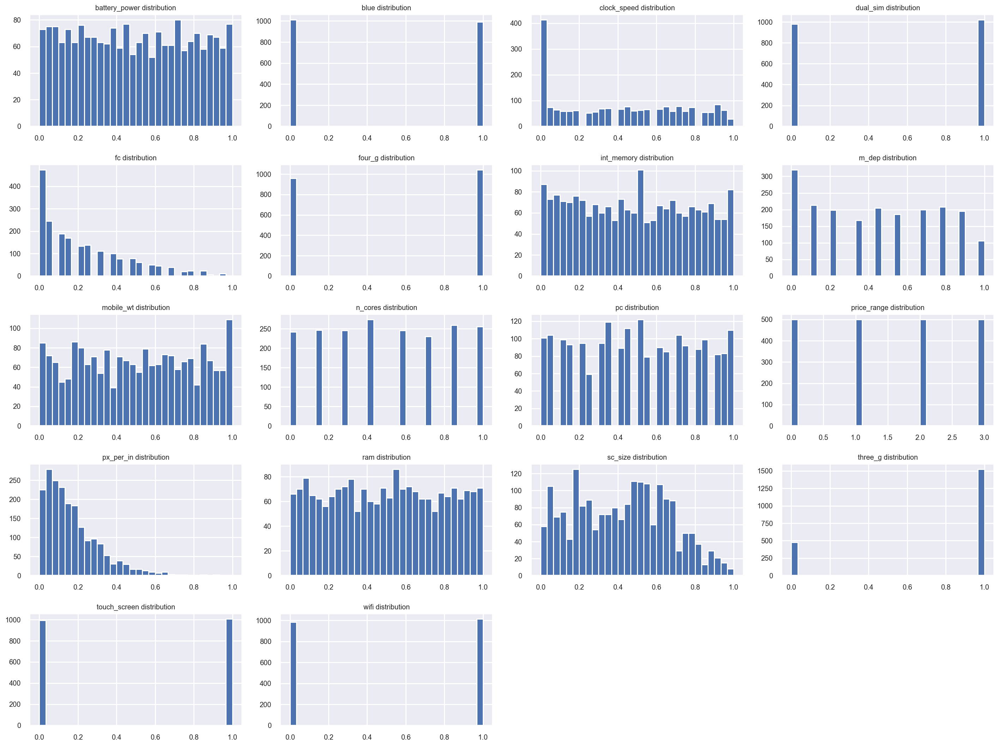

In [96]:
#plot multiple bar charts
def hist_loop(data: pd.DataFrame,
              rows: int,
              cols: int,
              figsize: tuple):
    fig, axes = plt.subplots(rows,cols, figsize=figsize)
    for i, ax in enumerate(axes.flatten()):
        if i < len(data.columns):
            data[sorted(data.columns)[i]].plot.hist(bins=30, ax=ax)
            ax.set_title(f'{sorted(data.columns)[i]} distribution', fontsize=10)
            ax.tick_params(axis='x', labelsize=10)
            ax.tick_params(axis='y', labelsize=10)
            ax.get_yaxis().get_label().set_visible(False)
        else:
            fig.delaxes(ax=ax)
    fig.tight_layout()
    
hist_loop(data=SF_df,
          rows=5,
          cols=4,
          figsize=(20,15))

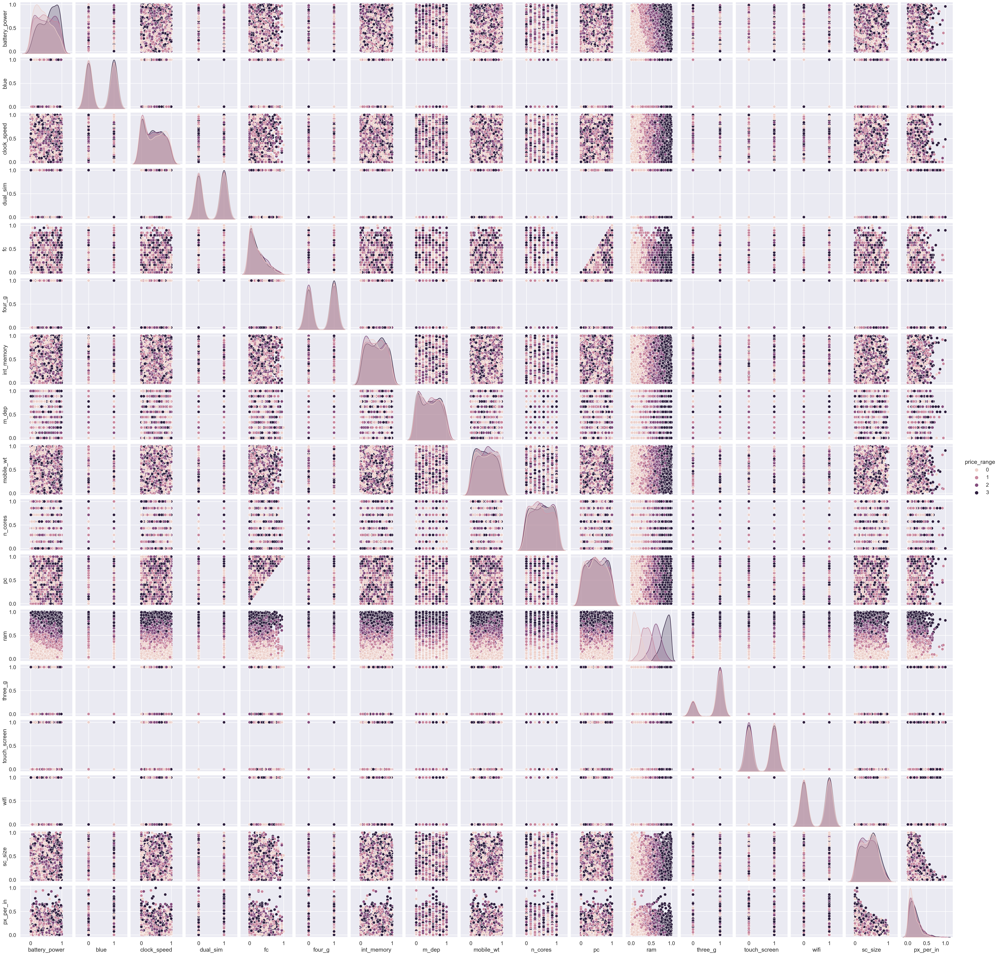

In [91]:
sns.set_context('talk')
sns.pairplot(SF_df, hue='price_range');

In [92]:
SF_df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,ram,three_g,touch_screen,wifi,sc_size,px_per_in,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,0.492664,0.4950,0.408900,0.509500,0.226816,0.521500,0.484621,0.446389,0.502075,0.502929,0.495825,0.499255,0.761500,0.503000,0.507000,0.421789,0.172698,1.500000
std,0.293533,0.5001,0.326402,0.500035,0.228497,0.499662,0.292673,0.320462,0.294997,0.326834,0.303216,0.289880,0.426273,0.500116,0.500076,0.242685,0.142928,1.118314
min,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.234302,0.0000,0.080000,0.000000,0.052632,0.000000,0.225806,0.111111,0.241667,0.285714,0.250000,0.254276,1.000000,0.000000,0.000000,0.204819,0.066416,0.750000
50%,0.484302,0.0000,0.400000,1.000000,0.157895,1.000000,0.483871,0.444444,0.508333,0.428571,0.500000,0.505211,1.000000,1.000000,1.000000,0.433735,0.138186,1.500000
75%,0.744322,1.0000,0.680000,1.000000,0.368421,1.000000,0.741935,0.777778,0.750000,0.857143,0.750000,0.750534,1.000000,1.000000,1.000000,0.602410,0.238921,2.250000
max,1.000000,1.0000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000


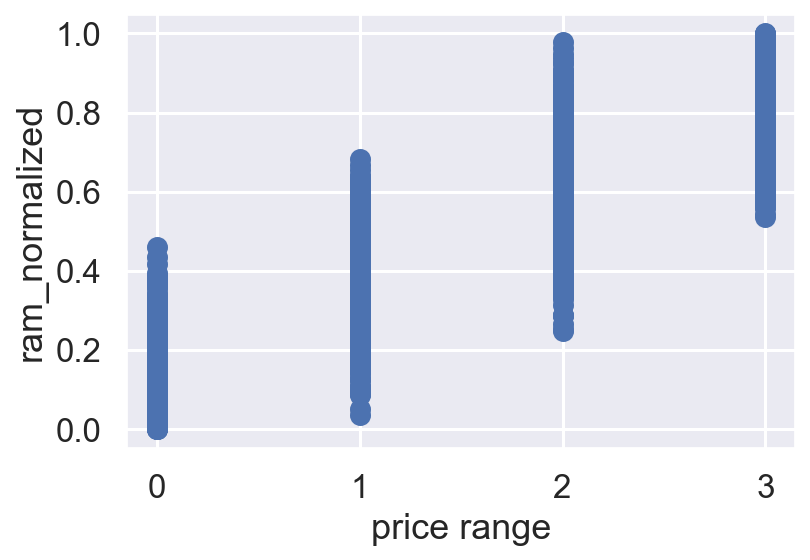

In [117]:
plt.scatter(SF_df["price_range"], SF_df["ram"])
matplotlib.pyplot.xlabel("price range", fontdict=None, labelpad=None )
matplotlib.pyplot.ylabel("ram_normalized", fontdict=None, labelpad=None )
plt.show()

In [118]:
SF_df.loc[(SF_df["ram"]>=0.75) & (SF_df["price_range"] == 3)]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,ram,three_g,touch_screen,wifi,sc_size,px_per_in,price_range
6,0.881764,0.0,0.48,0.0,0.210526,1.0,0.129032,0.777778,0.491667,1.000000,0.50,0.792090,1.0,0.0,1.0,0.481928,0.084757,3
10,0.179025,1.0,0.96,1.0,0.000000,0.0,0.112903,0.000000,0.850000,0.571429,0.05,0.986104,0.0,0.0,0.0,0.012048,0.143541,3
11,0.680695,1.0,0.68,0.0,0.263158,1.0,0.500000,0.444444,0.808333,1.000000,0.90,0.954035,1.0,1.0,1.0,0.554217,0.031214,3
16,0.225117,0.0,0.00,0.0,0.052632,1.0,0.177419,0.000000,0.966667,1.000000,0.20,0.881347,1.0,0.0,1.0,0.397590,0.284689,3
17,0.062792,0.0,0.16,1.0,0.368421,1.0,0.338710,0.000000,0.341667,0.285714,0.85,0.934260,1.0,1.0,0.0,0.240964,0.127592,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,0.887108,1.0,0.64,0.0,0.421053,0.0,0.919355,0.000000,0.091667,0.571429,0.75,0.771245,1.0,1.0,1.0,0.566265,0.263500,3
1991,0.922512,0.0,0.60,0.0,0.578947,1.0,0.677419,0.777778,0.275000,1.000000,0.95,0.888028,1.0,1.0,0.0,0.734940,0.000570,3
1993,0.645291,1.0,0.00,0.0,0.000000,0.0,0.258065,0.555556,0.350000,0.571429,0.00,0.990379,1.0,1.0,1.0,0.638554,0.171337,3
1994,0.238477,0.0,0.68,0.0,0.052632,0.0,0.774194,0.000000,0.033333,0.000000,0.10,0.994655,1.0,1.0,0.0,0.867470,0.089884,3


In [119]:
SF_df.loc[(SF_df['price_range'] ==3)]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,ram,three_g,touch_screen,wifi,sc_size,px_per_in,price_range
6,0.881764,0.0,0.48,0.0,0.210526,1.0,0.129032,0.777778,0.491667,1.000000,0.50,0.792090,1.0,0.0,1.0,0.481928,0.084757,3
10,0.179025,1.0,0.96,1.0,0.000000,0.0,0.112903,0.000000,0.850000,0.571429,0.05,0.986104,0.0,0.0,0.0,0.012048,0.143541,3
11,0.680695,1.0,0.68,0.0,0.263158,1.0,0.500000,0.444444,0.808333,1.000000,0.90,0.954035,1.0,1.0,1.0,0.554217,0.031214,3
16,0.225117,0.0,0.00,0.0,0.052632,1.0,0.177419,0.000000,0.966667,1.000000,0.20,0.881347,1.0,0.0,1.0,0.397590,0.284689,3
17,0.062792,0.0,0.16,1.0,0.368421,1.0,0.338710,0.000000,0.341667,0.285714,0.85,0.934260,1.0,1.0,0.0,0.240964,0.127592,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1991,0.922512,0.0,0.60,0.0,0.578947,1.0,0.677419,0.777778,0.275000,1.000000,0.95,0.888028,1.0,1.0,0.0,0.734940,0.000570,3
1993,0.645291,1.0,0.00,0.0,0.000000,0.0,0.258065,0.555556,0.350000,0.571429,0.00,0.990379,1.0,1.0,1.0,0.638554,0.171337,3
1994,0.238477,0.0,0.68,0.0,0.052632,0.0,0.774194,0.000000,0.033333,0.000000,0.10,0.994655,1.0,1.0,0.0,0.867470,0.089884,3
1997,0.941884,0.0,0.16,1.0,0.052632,1.0,0.548387,0.666667,0.233333,1.000000,0.15,0.748530,1.0,1.0,0.0,0.192771,0.279107,3
